# An Introduction to SAR Change Detection Methods with NISAR

<br>
This notebook introduces several commonly used SAR change detection methods that can be applied to radar image time series data. We provide both time-series and pair-wise SAR change detection workflows using NISAR GCOV data products and xarray-based raster analysis.

<br>
More specifically, this notebook covers the following SAR change detection concepts:

- Time series percentile difference and variance thresholding
- Time series coefficient of variation thresholding
- Log ratio-based pair-wise change detection from image pairs
- Threshold-based SAR change mask generation
- Exporting change detection products as GeoTIFF files

::: {dropdown} Why use SAR for change detection? 
Synthetic Aperture Radar (SAR) is particularly well suited for change detection because SAR sensors operate independently of cloud cover and solar illumination conditions. As active sensors, SAR systems transmit and receive their own microwave signals, allowing repeated, consistent observations of the Earth's surface. Differences observed between repeated SAR acquisitions can therefore often be directly related to physical surface changes.
:::

## Overview

1. [Prerequisites](changedet-prereqs)
1. [Load NISAR Data Stack](changedet-loaddata)
1. [Open and Organize GCOV data](changedet-openorganize)
1. [Define Helper Python Functions](changedet-python)
1. [Visualize the GCOV Time Series](changedet-visualizets)
1. [Computation and Visualization of Time Series Metrics](changedet-tsmetrics)
1. [Experimenting with different SAR Change Detection Methods](changedet-changedetmethods)
1. [Write Change Detection Results and Metrics to GeoTIFF Files](changedet-files)
1. [Summary](changedet-summary)
1. [Resources and References](changedet-resources)

<hr>

## 1. Prerequisites
(changedet-prereqs)=
| Prerequisite | Importance | Notes |
| --- | --- | --- |
| [The software environment for this cookbook must be installed](https://github.com/ASFOpenSARlab/NISAR_GCOV_Cookbook/blob/main/notebooks/software_environment_docker.ipynb) | Necessary | |

- **Rough Notebook Time Estimate**: 20 minutes

<hr>

(changedet-loaddata)=

## 2. Load NISAR Data Stack

If you do not have NISAR GCOV data prepared, you can prepare data via the [**Search and Download NISAR GCOV Data with asf_search**](https://asfopensarlab.github.io/NISAR_Cookbook/notebooks/search-download-nisar-gcov-asf-search/) notebook from the [**NISAR Cookbook**](https://asfopensarlab.github.io/NISAR_Cookbook/).

To learn more about using NISAR data, please visit the [NISAR Data User Guide](https://nisar-docs.asf.alaska.edu/). These services are provided by the [Alaska Satellite Facility](https://www.asf.alaska.edu/). 

**Select the directory holding your NISAR GCOV data**
- Click the `Select` button
- Navigate to your data directory
- Click the `Select` button
- Confirm that the desired path appears in green text
- Click the `Change` button to alter your selection

In [1]:
from pathlib import Path
from ipyfilechooser import FileChooser
fc = FileChooser(Path.cwd())
display(fc)

FileChooser(path='/home/jovyan/NISAR_GCOV_Cookbook/notebooks', filename='', title='', show_hidden=False, selec…

**Prepare output paths and GCOV `.h5` file list**

In [2]:
data_dir = Path(fc.selected)

# create a folder for saving output figures
plot_dir = data_dir / "plots"
plot_dir.mkdir(exist_ok=True)

# write path to GCOV files
gcov_files = sorted(list(data_dir.glob("*.h5")))
gcov_files

[PosixPath('/home/jovyan/NISAR_change_detection_example/NISAR_L2_PR_GCOV_004_042_A_019_2005_DHDH_A_20251101T022728_20251101T022803_X05010_N_F_J_001.h5'),
 PosixPath('/home/jovyan/NISAR_change_detection_example/NISAR_L2_PR_GCOV_005_042_A_019_2005_DHDH_A_20251113T022729_20251113T022803_X05009_N_F_J_001.h5'),
 PosixPath('/home/jovyan/NISAR_change_detection_example/NISAR_L2_PR_GCOV_006_042_A_019_2005_DHDH_A_20251125T022729_20251125T022804_X05009_N_F_J_001.h5'),
 PosixPath('/home/jovyan/NISAR_change_detection_example/NISAR_L2_PR_GCOV_007_042_A_019_2005_DHDH_A_20251207T022730_20251207T022804_X05009_N_F_J_001.h5'),
 PosixPath('/home/jovyan/NISAR_change_detection_example/NISAR_L2_PR_GCOV_008_042_A_019_2005_DHDH_A_20251219T022730_20251219T022805_X05009_N_F_J_001.h5'),
 PosixPath('/home/jovyan/NISAR_change_detection_example/NISAR_L2_PR_GCOV_009_042_A_019_2005_DHDH_A_20251231T022731_20251231T022805_X05009_N_F_J_001.h5')]

(changedet-openorganize)=

## 3. Open and Organize GCOV files 
This section opens the NISAR GCOV `.h5` files and combines them into a single `xarray.Dataset`. 

::: {dropdown} More about this section 
The workflow in Section 3 extracts raster frequency variables, spatial coordinates, projection information, and acquisition times from each file, then stacks them into a four-dimensional data cube. Dask is used for lazy loading so the data can be explored efficiently and without loading the entire stack into memory at once.

Organizing the data into a labeled `xarray.Dataset` simplifies downstream analysis and visualization by allowing the GCOV stack to be treated as a single spatiotemporal dataset rather than a collection of separate files.
:::

In [3]:
import re
import h5py
import numpy as np
import xarray as xr
import dask.array as da
from dask import delayed

_date_regex = re.compile(r"_(\d{8}T\d{6})_")
def _get_ts(filename):
    match = _date_regex.search(filename)
    if match:
        ts_str = match.group(1)
        return np.datetime64(f"{ts_str[:4]}-{ts_str[4:6]}-{ts_str[6:8]}T{ts_str[9:11]}:{ts_str[11:13]}:{ts_str[13:15]}") 
    return np.datetime64("NaT")

def open_gcov(gcov_paths, vars_to_load=("HHHH", "HVHV", "mask", "numberOfLooks", "rtcGammaToSigmaFactor"), freqs=("A","B"), max_xy_chunk=2048):
    gcov_paths = sorted(gcov_paths)
    group = {f: f"/science/LSAR/GCOV/grids/frequency{f}" for f in freqs}
    with h5py.File(gcov_paths[0], "r") as f0:
        g = f0[group[freqs[0]]]
        x, y = g["xCoordinates"][...], g["yCoordinates"][...]
        proj = g["projection"][()]
    ny, nx = len(y), len(x)
    time = np.array([_get_ts(p.name) for p in gcov_paths])
    chunks = (1, 1, min(ny, max_xy_chunk), min(nx, max_xy_chunk))  # (time, frequency, y, x)

    data_vars = {}
    for v in vars_to_load:
        per_freq = []
        for freq in freqs:
            with h5py.File(gcov_paths[0], "r") as f0:
                dt = f0[f"{group[freq]}/{v}"].dtype
            planes = [da.from_delayed(delayed(lambda p, d: h5py.File(p,"r")[d][...])(p, f"{group[freq]}/{v}"),
                                      shape=(ny, nx), dtype=dt)[None, None, ...]
                      for p in gcov_paths]
            per_freq.append(da.concatenate(planes, axis=0))
        stacked = da.concatenate(per_freq, axis=1).rechunk(chunks)
        data_vars[v] = (("time","frequency","y","x"), stacked)

    return xr.Dataset(
        data_vars=data_vars,
        coords={"time": time, "frequency": np.array(list(freqs)), "y": y, "x": x},
        attrs={"source": "NISAR L2 GCOV", "projection": proj},
    )

The dataset summary below verifies that the GCOV files were successfully combined into a 4D xarray data cube with dimensions `(time, frequency, y, x)`. 

The summary also confirms that the raster variables were loaded as chunked Dask arrays (`dask.array<chunksize=...>`), enabling lazy loading and efficient processing of large SAR raster stacks.

In [4]:
ds = open_gcov(gcov_files)
ds

<xarray.Dataset> Size: 63GB
Dimensions:                (time: 6, frequency: 2, y: 17496, x: 17748)
Coordinates:
  * time                   (time) datetime64[s] 48B 2025-11-01T02:27:28 ... 2...
  * frequency              (frequency) <U1 8B 'A' 'B'
  * y                      (y) float64 140kB 4.011e+06 4.011e+06 ... 3.661e+06
  * x                      (x) float64 142kB 5.306e+05 5.307e+05 ... 8.856e+05
Data variables:
    HHHH                   (time, frequency, y, x) float32 15GB dask.array<chunksize=(1, 1, 2048, 2048), meta=np.ndarray>
    HVHV                   (time, frequency, y, x) float32 15GB dask.array<chunksize=(1, 1, 2048, 2048), meta=np.ndarray>
    mask                   (time, frequency, y, x) uint8 4GB dask.array<chunksize=(1, 1, 2048, 2048), meta=np.ndarray>
    numberOfLooks          (time, frequency, y, x) float32 15GB dask.array<chunksize=(1, 1, 2048, 2048), meta=np.ndarray>
    rtcGammaToSigmaFactor  (time, frequency, y, x) float32 15GB dask.array<chunksize=(1, 1, 2048, 2048), meta=np.ndarray>
Attributes:
    source:      NISAR L2 GCOV
    projection:  32637

#### Select a Spatial Subset. 
The full GCOV data cube is large, so this example selects a smaller subset for analysis.

#### Check dataset coordinate ranges

In [5]:
print(ds.x.min().values, ds.x.max().values)
print(ds.y.min().values, ds.y.max().values)

530650.0 885590.0
3661210.0 4011110.0


#### Select polarization and frequency, then extract subset 

In [6]:
%%time
polarization = "HVHV"
frequency = "A"

da = ds[polarization].sel(
    frequency=frequency,
    x=slice(600000, 700000),
    y=slice(3900000, 3800000)
)
da = da.assign_attrs({**ds.attrs, **da.attrs})

da

CPU times: user 4.06 ms, sys: 0 ns, total: 4.06 ms
Wall time: 3.22 ms


<xarray.DataArray 'HVHV' (time: 6, y: 5000, x: 5000)> Size: 600MB
dask.array<getitem, shape=(6, 5000, 5000), dtype=float32, chunksize=(1, 2048, 2048), chunktype=numpy.ndarray>
Coordinates:
  * time       (time) datetime64[s] 48B 2025-11-01T02:27:28 ... 2025-12-31T02...
  * y          (y) float64 40kB 3.9e+06 3.9e+06 3.9e+06 ... 3.8e+06 3.8e+06
  * x          (x) float64 40kB 6e+05 6e+05 6e+05 ... 7e+05 7e+05 7e+05
    frequency  <U1 4B 'A'
Attributes:
    source:      NISAR L2 GCOV
    projection:  32637

(changedet-python)=

## 4. Define Some Python Helper Functions for this Notebook

We are defining two helper functions for this notebook:

- **CreateGeoTiff()** to write out images
- **timeseries_metrics()** to compute various metrics from a time series data stack

In [7]:
def create_geotiff(name, array, data_type, ndv, bandnames=None, 
                   ref_image=None, geo_t=None, projection=None):
    # If it's a 2D image we fake a third dimension:
    if len(array.shape) == 2:
        array = np.array([array])
    if ref_image == None and (geo_t == None or projection == None):
        raise RuntimeWarning('ref_image or settings required.')
    if bandnames != None:
        if len(bandnames) != array.shape[0]:
            raise RuntimeError(f'Need {Array.shape[0]} bandnames. {len(bandnames)} given')
    else:
        bandnames = [f'Band {i+1}' for i in range(array.shape[0])]
    if ref_image != None:
        refimg = gdal.Open(ref_image)
        geo_t = refimg.GetGeoTransform()
        Projection = refimg.GetProjection()
    driver = gdal.GetDriverByName('GTIFF')
    array[np.isnan(array)] = ndv
    dataset = driver.Create(name, array.shape[2], array.shape[1], 
                            array.shape[0], data_type)
    dataset.SetGeoTransform(geo_t)
    dataset.SetProjection(projection)
    for i, image in enumerate(array, 1):
        dataset.GetRasterBand(i).WriteArray(image)
        dataset.GetRasterBand(i).SetNoDataValue(ndv)
        dataset.SetDescription(bandnames[i-1])
    dataset.FlushCache()
    return name

In [8]:
da

<xarray.DataArray 'HVHV' (time: 6, y: 5000, x: 5000)> Size: 600MB
dask.array<getitem, shape=(6, 5000, 5000), dtype=float32, chunksize=(1, 2048, 2048), chunktype=numpy.ndarray>
Coordinates:
  * time       (time) datetime64[s] 48B 2025-11-01T02:27:28 ... 2025-12-31T02...
  * y          (y) float64 40kB 3.9e+06 3.9e+06 3.9e+06 ... 3.8e+06 3.8e+06
  * x          (x) float64 40kB 6e+05 6e+05 6e+05 ... 7e+05 7e+05 7e+05
    frequency  <U1 4B 'A'
Attributes:
    source:      NISAR L2 GCOV
    projection:  32637

In [9]:
def timeseries_metrics(da):     
    q = da.quantile([0.05, 0.5, 0.95], dim="time")
    p05 = q.sel(quantile=0.05, drop=True)
    p50 = q.sel(quantile=0.50, drop=True)
    p95 = q.sel(quantile=0.95, drop=True)
    prange = p95 - p05
    
    max = da.max(dim="time")
    min = da.min(dim="time")
    range = max - min

    mean = da.mean(dim="time")
    var = da.var(dim="time")
    std = da.std(dim="time")
    cv = std / xr.where(mean != 0, mean, np.nan)
    
    return xr.Dataset(
        dict(
            min=min, max=max, range=range,
            mean=mean, var=var, std=std, CV=cv,
            p05=p05, p50=p50, p95=p95,
            prange=p95 - p05
        )
    )

(changedet-visualizets)=
## 5. Visualize the GCOV Time Series

This section prepares the selected GCOV backscatter stack for visualization and creates a simple animation to show how radar backscatter changes through time.

### 5.1 Convert Backscatter to dB

GCOV backscatter values are stored in linear power units. For visualization and interpretation, SAR backscatter is commonly converted to decibels (dB), which compresses the range of values and makes temporal differences easier to see.

In [10]:
%%time
da_db = 10*np.log10(da)
da_db

CPU times: user 1.67 ms, sys: 0 ns, total: 1.67 ms
Wall time: 1.68 ms


<xarray.DataArray 'HVHV' (time: 6, y: 5000, x: 5000)> Size: 600MB
dask.array<mul, shape=(6, 5000, 5000), dtype=float32, chunksize=(1, 2048, 2048), chunktype=numpy.ndarray>
Coordinates:
  * time       (time) datetime64[s] 48B 2025-11-01T02:27:28 ... 2025-12-31T02...
  * y          (y) float64 40kB 3.9e+06 3.9e+06 3.9e+06 ... 3.8e+06 3.8e+06
  * x          (x) float64 40kB 6e+05 6e+05 6e+05 ... 7e+05 7e+05 7e+05
    frequency  <U1 4B 'A'
Attributes:
    source:      NISAR L2 GCOV
    projection:  32637

### 5.2 Create a Time Series Animation

The animation displays each acquisition in sequence using the selected polarization, frequency, and spatial subset. This provides a quick visual check of temporal changes and helps identify areas with strong backscatter variability before applying change detection methods.

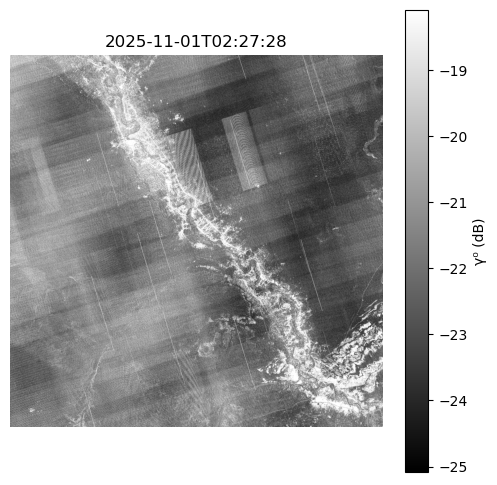

CPU times: user 20.2 s, sys: 1.58 s, total: 21.8 s
Wall time: 20.2 s


In [11]:
%%time
from matplotlib import pyplot as plt
from matplotlib.animation import FuncAnimation
from matplotlib.animation import FFMpegWriter, PillowWriter

vmin, vmax = (da_db.quantile([0.05, 0.95], skipna=True).values.astype(float))

fig, ax = plt.subplots(figsize=(6, 6))
frame_0 = da_db.isel(time=0).values
im = ax.imshow(frame_0, vmin=vmin, vmax=vmax, origin="upper", cmap="grey")
cb = fig.colorbar(im, ax=ax, label="γ⁰ (dB)")
ax.set_title(np.datetime_as_string(da_db.time.values[0], unit='s'))
ax.set_axis_off()

def animate(i):
    frame = da_db.isel(time=i).values
    im.set_data(frame)
    ax.set_title(np.datetime_as_string(da_db.time.values[i], unit='s'))
    return (im,)

ani = FuncAnimation(fig, animate, frames=da_db.sizes["time"], interval=300, blit=False)

plt.show()

In [12]:
from IPython.display import HTML

HTML(ani.to_jshtml())

**Save the animation (animation.gif):**

In [13]:
ani.save(plot_dir/f'animation.gif', writer='pillow', fps=2)

(changedet-tsmetrics)=
## 6. Computation and Visualization of Time Series Metrics

Once the GCOV time series stack has been constructed, we can compute a set of temporal statistics for each pixel in the stack. These metrics summarize how radar backscatter changes through time and can help identify areas with persistent variability or anomalous temporal behavior.

The metrics computed in this section include:

- Mean
- Median
- Maximum
- Minimum
- Range (Maximum − Minimum)
- 5th Percentile
- 95th Percentile
- Percentile Range (95th − 5th Percentile)
- Variance
- Standard Deviation
- Coefficient of Variation (Standard Deviation / Mean)

These statistics are computed independently for every pixel across the time dimension of the GCOV stack.

In [14]:
%%time

# compute temporal metrics from the GCOV stack
metrics = timeseries_metrics(da)

# load results into memory
metrics.load()

metrics

CPU times: user 57.8 s, sys: 10.5 s, total: 1min 8s
Wall time: 51.3 s


<xarray.Dataset> Size: 2GB
Dimensions:    (y: 5000, x: 5000)
Coordinates:
  * y          (y) float64 40kB 3.9e+06 3.9e+06 3.9e+06 ... 3.8e+06 3.8e+06
  * x          (x) float64 40kB 6e+05 6e+05 6e+05 ... 7e+05 7e+05 7e+05
    frequency  <U1 4B 'A'
Data variables:
    min        (y, x) float32 100MB 0.007768 0.00614 ... 0.02512 0.01146
    max        (y, x) float32 100MB 0.01648 0.01887 0.01443 ... 0.04327 0.02279
    range      (y, x) float32 100MB 0.00871 0.01273 0.009284 ... 0.01814 0.01134
    mean       (y, x) float32 100MB 0.01165 0.01155 0.009864 ... 0.03598 0.01603
    var        (y, x) float32 100MB 1.138e-05 1.852e-05 ... 4.77e-05 1.385e-05
    std        (y, x) float32 100MB 0.003374 0.004303 ... 0.006907 0.003722
    CV         (y, x) float32 100MB 0.2897 0.3727 0.3137 ... 0.1638 0.192 0.2322
    p05        (y, x) float64 200MB 0.007792 0.006498 ... 0.02579 0.01167
    p50        (y, x) float64 200MB 0.01144 0.0109 0.01036 ... 0.03954 0.01602
    p95        (y, x) float64 200MB 0.01608 0.01788 0.01378 ... 0.0426 0.02148
    prange     (y, x) float64 200MB 0.008287 0.01138 ... 0.01681 0.009815

In [15]:
# access the coefficient of variation raster
cv = metrics["CV"]

The coefficient of variation and variance layers can now be visualized and thresholded to identify areas exhibiting stronger temporal variability within the SAR time series.

In [16]:
np.min(cv)

<xarray.DataArray 'CV' ()> Size: 4B
array(0.00597418, dtype=float32)
Coordinates:
    frequency  <U1 4B 'A'
Attributes:
    source:      NISAR L2 GCOV
    projection:  32637

In [17]:
np.max(cv)

<xarray.DataArray 'CV' ()> Size: 4B
array(2.224425, dtype=float32)
Coordinates:
    frequency  <U1 4B 'A'
Attributes:
    source:      NISAR L2 GCOV
    projection:  32637

In [18]:
len(cv)

5000

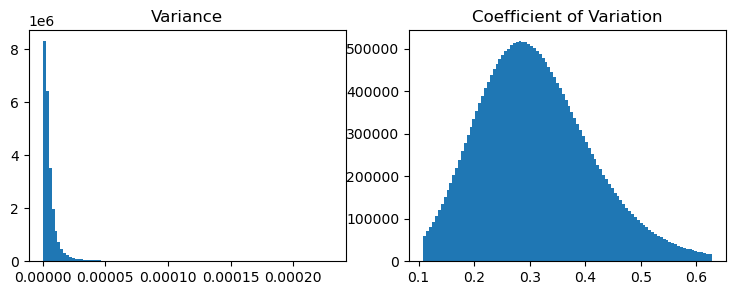

In [19]:
from matplotlib import pyplot as plt

fig, ax = plt.subplots(1,2,figsize=(9, 3))

var = metrics["var"].values.ravel()
ax[0].hist(var, bins=100, range=np.nanpercentile(var, [1,99]))
ax[0].set_title('Variance')

cv = metrics["CV"].values.ravel()
ax[1].hist(cv, bins=100, range=np.nanpercentile(cv, [1,99]))
ax[1].set_title('Coefficient of Variation')

plt.show()

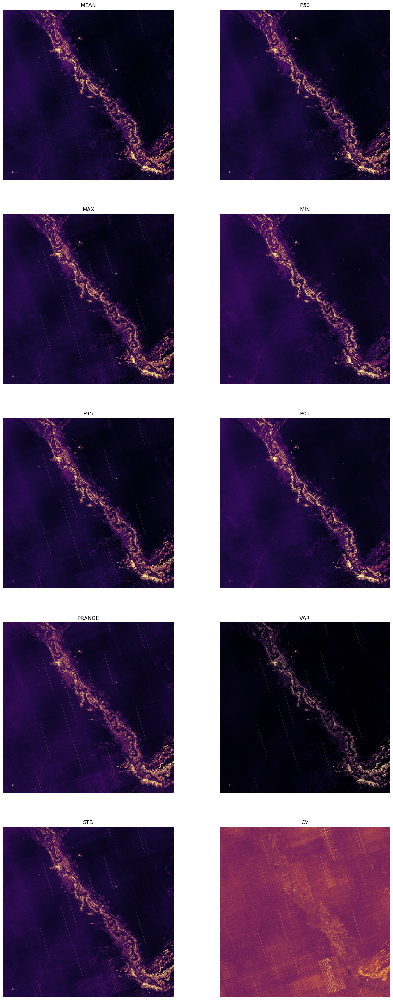

In [20]:
# List the metrics keys you want to plot
metric_keys=['mean', 'p50', 'max', 'min', 
             'p95', 'p05', 'prange', 'var', 'std', 'CV']
fig= plt.figure(figsize=(16,40))
idx=1
for i in metric_keys:
    ax = fig.add_subplot(5,2,idx)
    vmin, vmax = np.nanpercentile(metrics[i], [1, 99])
    ax.imshow(metrics[i],vmin=vmin,vmax=vmax,cmap='inferno')
    ax.set_title(i.upper())
    ax.axis('off')
    idx+=1

(changedet-changedetmethods)=
## 7. Experimenting with different SAR Change Detection Methods

This section introduces several commonly used SAR change detection approaches for identifying temporal variability in radar backscatter. These methods can be broadly divided into two categories: time-series approaches, which analyze variability across all acquisitions in the stack, and pair-wise approaches, which compare two individual acquisitions directly. The choice of method depends on the type of change being investigated and whether the goal is to characterize long-term temporal variability or isolate changes between specific acquisition dates.

### 7.1 Time-Series Change Detection Methods

Time-series methods analyze variability across the full GCOV acquisition stack to identify pixels with persistent or statistically significant temporal changes through time. These approaches are useful for studying seasonal behavior, long-term variability, recurring disturbances, or areas that exhibit unusually dynamic radar backscatter across the observation period.

#### 7.1.1 Change Detection with the Percentile Difference and the Variance Threshold Method

Time-series methods identify areas with strong temporal variability by calculating statistics across the SAR acquisition stack.

In this section, we use metrics including percentile range (`p95 - p05`), variance and standard deviation to identify pixels with unusually large temporal changes.

In [21]:
def plot_histogram_cdf(metric='std'):
    plt.rcParams.update({'font.size': 12})
    fig = plt.figure(figsize=(14, 4)) # Initialize figure with a size
    ax1 = fig.add_subplot(121)  # 121 determines: 2 rows, 2 plots, first plot
    ax2 = fig.add_subplot(122)

    h = ax1.hist(
        metrics[metric].values.ravel(), range=np.nanpercentile(metrics[metric], [1, 99]))
    ax1.xaxis.set_label_text(f'{metric}')
    ax1.set_title('Histogram')

    n, bins, patches = ax2.hist(
        metrics[metric].values.ravel(), range=np.nanpercentile(metrics[metric], [1, 99]),
        cumulative='True', density='True', histtype='step', label='Empirical')

    ax2.xaxis.set_label_text(f'{metric}')
    ax2.set_title('CDF')

    outind = np.where(n > 0.95)   
    threshind = np.min(outind)
    thresh = bins[threshind]
    ax1.axvline(thresh,color='red')
    _ = ax2.axvline(thresh,color='red')
    plt.savefig(plot_dir/f'{metric}_histogram.png',
                dpi=200, transparent='true')

**Now let's look at the 95th - 5th percentile range of radar backscatter values across the designated temporal period**

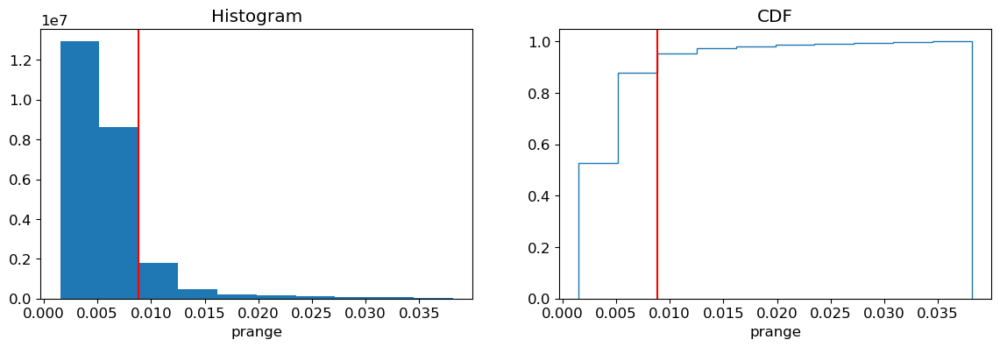

In [22]:
plot_histogram_cdf(metric='prange')

Let's visualize the 5% of all pixels with the largest (95th - 5th percentile) difference in the time series. We will refer to the pixels (x,y) that exceed this threshold $t$ as likely **change pixels (cp):**

${cp}_{x,y} = P_{x,y}^{95th} - P_{x,y}^{5th} > t$ 

If the threshold $t$ is set to the top 5% of pixels with the largest $(p95 - p05)$ values, the resulting change mask looks like:

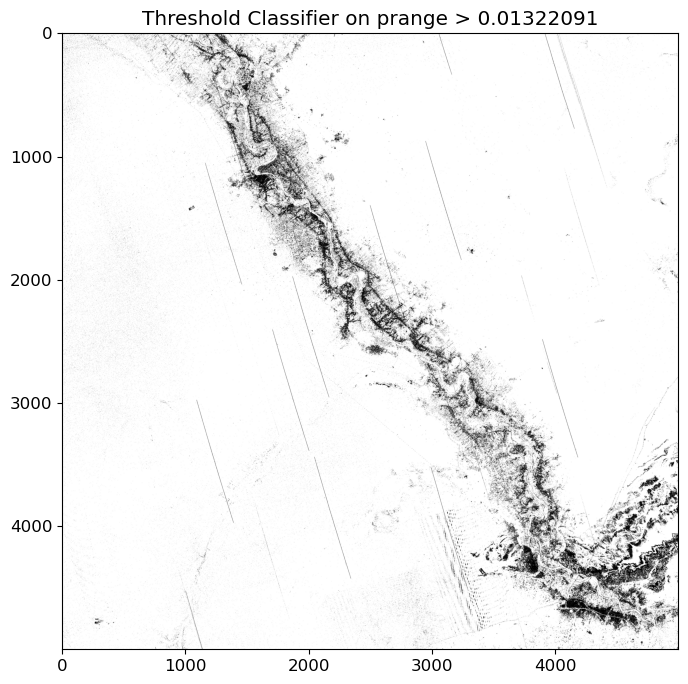

In [23]:
def plot_threshold_classifier(metric='prange', percentage_cutoff=5):
    plt.figure(figsize=(8,8))
    thresh = np.nanpercentile(metrics[metric], 100 - percentage_cutoff)
    mask = metrics[metric] < thresh # For display we prepare the inverse mask
    plt.imshow(mask, cmap='gray')
    _=plt.title(f'Threshold Classifier on {metric} > %1.8f' % thresh)
    plt.savefig(plot_dir/f'changes_{metric}.png',
            dpi=200, transparent='true')
    return np.logical_not(mask)

metric = 'prange'
masks = {metric: plot_threshold_classifier(metric=metric)}

**Thresholding other metrics**
<br>
Instead of applying a threshold on the 95th - 5th percentile difference data, we can also attempt to threshold other metrics. Pixels with high **standard deviation** are areas where radar backscatter changes strongly throughout the time series.

Here, change pixels are defined as:

${cp}_{x,y} = \sigma > t$ 

with $t=CDF_{\sigma} > 0.95$, where the threshold $t$ corresponds to the top 5% of pixels with the highest standard deviation values.

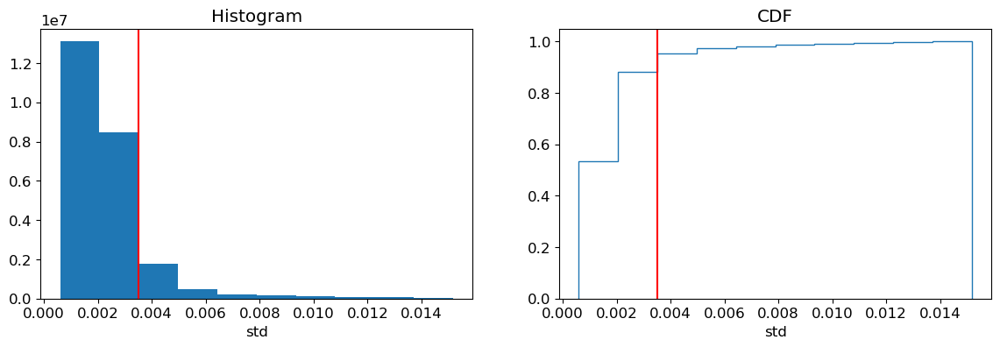

In [24]:
plot_histogram_cdf(metric='std')

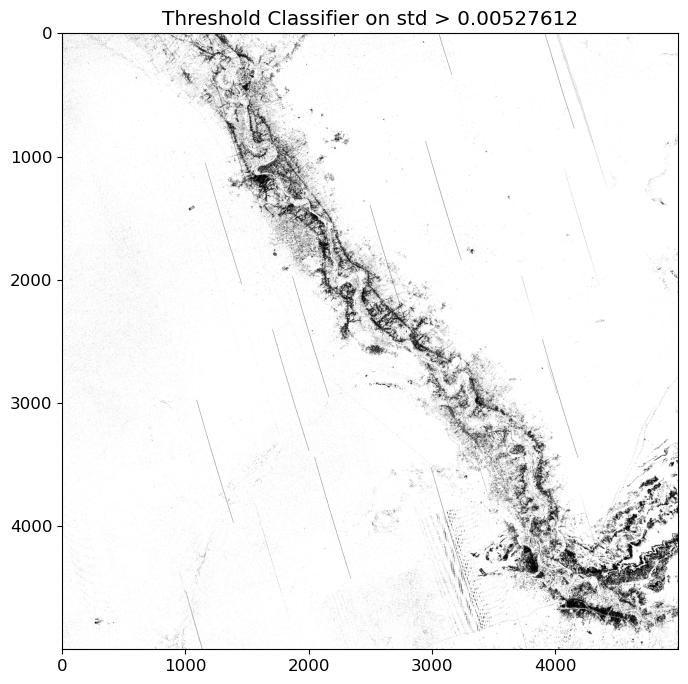

In [25]:
metric = 'std'
masks[metric] = plot_threshold_classifier(metric=metric)

#### 7.1.2 Change Detection with the Coefficient of Variation Method

We can apply a threshold to the **coefficient of variation** (CV) image to identify pixels with strong temporal variability in the SAR time series:

$$
CV_{x,y} = \frac{\sigma_{x,y}}{\bar{X}_{x,y}} > t
$$

The coefficient of variation (CV) measures the ratio of temporal variability to the mean backscatter value for each pixel.

Pixels with high CV values may indicate areas experiencing stronger temporal variability or surface change throughout the acquisition period. The coefficient of variation can be especially useful because it normalizes variability relative to the mean signal level, making it easier to compare regions with different average backscatter values.

Let's now examine the histogram and cumulative distribution function (CDF) of the CV values.

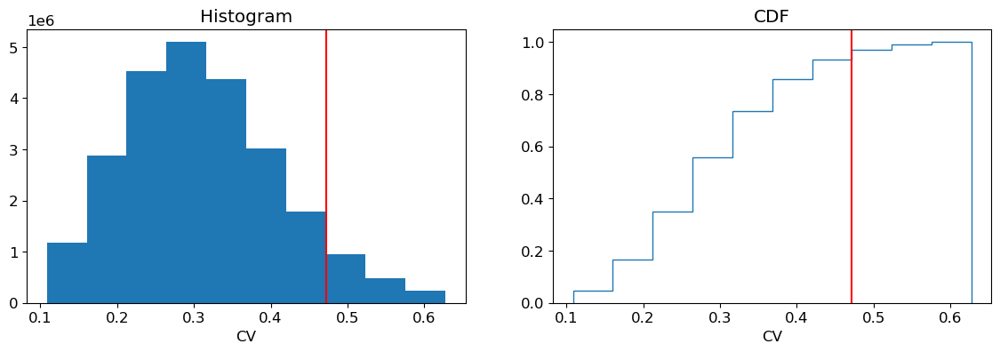

In [26]:
plot_histogram_cdf(metric='CV')

$t=CDF_{CV} > 0.95$

With $t$ defined as the top 5% of pixels with the highest CV values, the resulting change mask looks like:

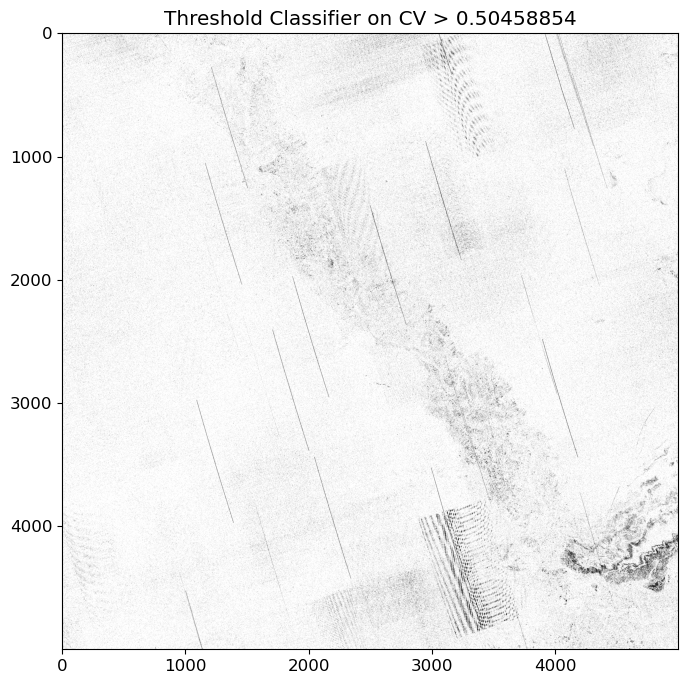

In [27]:
metric = 'CV'
masks[metric] = plot_threshold_classifier(metric=metric)

## 7.2 Pair-Wise Change Detection

Pair-wise change detection compares two individual acquisitions to identify localized temporal changes between observation dates. In radar remote sensing, this is commonly performed using ratios in the linearly scaled power domain or differences in the logarithmic dB domain. Pair-wise approaches are useful when the objective is to isolate changes associated with a specific event or time interval, such as flooding, vegetation disturbance, snow accumulation, surface deformation or infrastructure changes occurring between two acquisitions.

This section identifies the dataset scenes closest to two user-defined acquisition dates within the GCOV time series. They can later be used for image differencing, visualization and threshold-based change detection analysis.

In [28]:
from datetime import datetime

# extract dataset acquisition times
tindex = ds.time.values

# define target dates for comparison
dates = ('2025-11-15', '2025-12-01')

# convert strings into NumPy-compatible datetime objects
dates_ = [np.datetime64(datetime.strptime(date, '%Y-%m-%d')) for date in dates]

# find the nearest acquisition index for each target date
dates_ind = [np.argmin(np.abs(date - tindex)) for date in dates_]

# print the matching acquisition dates from the dataset
print(f'Comparing image {dates_ind[0]} from {tindex[dates_ind[0]]} with {dates_ind[1]} from {tindex[dates_ind[1]]}')

Comparing image 1 from 2025-11-13T02:27:29 with 2 from 2025-11-25T02:27:29


In [29]:
da.time

<xarray.DataArray 'time' (time: 6)> Size: 48B
array(['2025-11-01T02:27:28', '2025-11-13T02:27:29', '2025-11-25T02:27:29',
       '2025-12-07T02:27:30', '2025-12-19T02:27:30', '2025-12-31T02:27:31'],
      dtype='datetime64[s]')
Coordinates:
  * time       (time) datetime64[s] 48B 2025-11-01T02:27:28 ... 2025-12-31T02...
    frequency  <U1 4B 'A'

**Compute the log ratio in dB**, corresponding to the difference in dB

In [30]:
# select the dataset scenes closest to the user-defined dates
date_0 = da.isel(time=dates_ind[0])
date_1 = da.isel(time=dates_ind[1])

# compute the logarithmic ratio in dB between the two acquisitions
ratio_dB = 10 * np.log10(date_1 / date_0)

ratio_dB

<xarray.DataArray 'HVHV' (y: 5000, x: 5000)> Size: 100MB
dask.array<mul, shape=(5000, 5000), dtype=float32, chunksize=(2048, 2048), chunktype=numpy.ndarray>
Coordinates:
  * y          (y) float64 40kB 3.9e+06 3.9e+06 3.9e+06 ... 3.8e+06 3.8e+06
  * x          (x) float64 40kB 6e+05 6e+05 6e+05 ... 7e+05 7e+05 7e+05
    frequency  <U1 4B 'A'
Attributes:
    source:      NISAR L2 GCOV
    projection:  32637

**Manually Select a Threshold**

- `thresh` sets the threshold value (for example, `-2 dB`)
- `thresh_type` controls whether values below (`lower`) or above (`upper`) the threshold are masked

In [31]:
# compute the 1st and 99th percentile values of the ratio image
low, high = (ratio_dB.quantile([0.01, 0.99]))

print(low.compute().item())
print(high.compute().item())

# define a manual threshold for change detection
thresh = -2

# identify pixels meeting the threshold condition
a = ratio_dB < thresh

# check whether any pixels meet the threshold condition
a.max().compute().item()

-6.200385594367981
3.8742807126045262


True

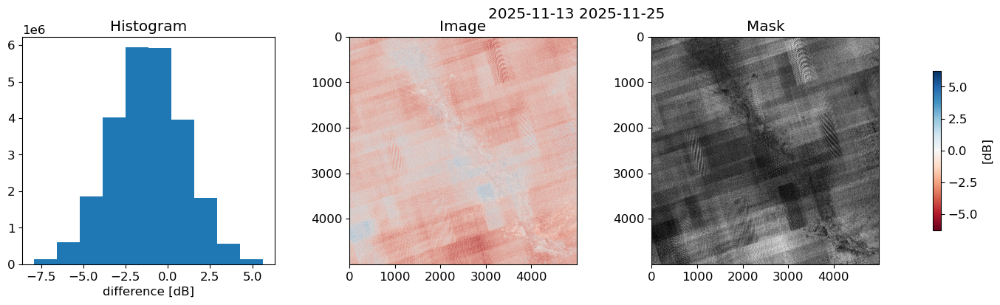

In [32]:
thresh = -2
thresh_type = 'lower'  # 'lower': mask values below thresh, 'upper': mask values above thresh

# use the absolute dB ratio to set a symmetric display range
abs_ratio_dB = np.abs(ratio_dB)
dynamic_range = abs_ratio_dB.quantile(0.99, skipna=True).compute().item()

# create a 3-panel figure: histogram, ratio image, and threshold mask
fig, axs = plt.subplots(ncols=3, nrows=1)
fig.set_size_inches(20, 4)
plt.subplots_adjust(hspace=0.4, right=0.85)

# plot histogram of ratio values
axs[0].hist(
    ratio_dB.values.ravel(),
    bins=10,
    range=np.nanpercentile(ratio_dB, [0.1, 99.9])
)

axs[0].set_xlabel('difference [dB]')
axs[0].set_title('Histogram')

# display the log-ratio image
im0 = axs[1].imshow(
    ratio_dB,
    cmap='RdBu',
    vmin=-dynamic_range,
    vmax=dynamic_range
)

cbar = fig.colorbar(im0, orientation='vertical', ax=axs.ravel().tolist(), shrink=0.7)
cbar.set_label('[dB]')
axs[1].set_title('Image')

# create a binary mask from the selected threshold
mask = (ratio_dB < thresh if thresh_type == 'lower' else ratio_dB > thresh).astype(np.int8)

# display the threshold mask
axs[2].imshow(mask, cmap='gray')
axs[2].set_title('Mask')

# convert numpy datetime64 values to date strings for the title and filename
date0_str = np.datetime_as_string(tindex[dates_ind[0]], unit='D')
date1_str = np.datetime_as_string(tindex[dates_ind[1]], unit='D')

fig.suptitle(f'{date0_str} {date1_str}')

logratiolabel = f'logratio_{date0_str}_{date1_str}'

plt.savefig(
    plot_dir / f'{logratiolabel}.png',
    dpi=200,
    transparent=True
)

# store the inverse of the mask for later use
masks[logratiolabel] = np.logical_not(mask)

**Do you think the threshold is appropriate? If not, try adjusting it.**

(changedet-files)=
## 8. Write Change Detection Results and Metrics to GeoTIFF Files

This section exports the computed change detection results as georeferenced GeoTIFF files.

Both time-series metrics and pair-wise change detection outputs can be saved as GIS-ready raster products for visualization and downstream analysis.

### 8.1 Determine Output Geometry

First, we define the geotransform and projection information for the output GeoTIFFs.

Because the workflow operates directly from GCOV data opened with xarray, the output geometry is derived from the dataset coordinate arrays.

In [33]:
# Get projection information from the GCOV dataset
proj = ds.attrs["projection"]

# Calculate pixel spacing from the coordinate arrays
xres = float(da.x[1] - da.x[0])
yres = float(da.y[1] - da.y[0])

# Build the geotransform for the output rasters
geotrans = [
    float(da.x.min()),   # upper-left x coordinate
    xres,                # pixel width
    0,
    float(da.y.max()),   # upper-left y coordinate
    0,
    -abs(yres)           # negative pixel height for north-up rasters
]

geotrans

[600010.0, 20.0, 0, 3899990.0, 0, -20.0]

### 8.2 Export Time-Series Metrics

This section exports the time-series metric rasters, such as variance and coefficient of variation, as GeoTIFF files for GIS visualization and analysis.analysis.

In [34]:
# Create a directory for the exported metric images
metricDir = plot_dir / "ts_metrics"
metricDir.mkdir(exist_ok=True)

print(metricDir)

/home/jovyan/NISAR_change_detection_example/plots/ts_metrics


In [35]:
from osgeo import gdal, osr

# Convert EPSG code from the GCOV dataset into a GDAL projection string
epsg = int(ds.attrs["projection"])

srs = osr.SpatialReference()
srs.ImportFromEPSG(epsg)
proj = srs.ExportToWkt()

/home/jovyan/NISAR_GCOV_Cookbook/.pixi/envs/isce3/lib/python3.13/site-packages/osgeo/osr.py:424: FutureWarning: Neither osr.UseExceptions() nor osr.DontUseExceptions() has been explicitly called. In GDAL 4.0, exceptions will be enabled by default.
  warnings.warn(


In [36]:
labeldb = polarization

names = []  # keep track of exported filenames

for metric in metrics:

    name_ = metricDir / f'{metric}_{labeldb}.tif'

    create_geotiff(
        str(name_),
        metrics[metric],
        gdal.GDT_Float32,
        np.nan,
        [metric],
        geo_t=geotrans,
        projection=proj
    )

    names.append(str(name_))

### 8.3 Build a Virtual Raster Stack (VRT)

A Virtual Raster (VRT) can be created to combine the exported metric GeoTIFFs into a single virtual raster stack.

The VRT references the original rasters without duplicating the underlying data.

In [37]:
# Build a virtual raster stack (VRT) from the exported metric GeoTIFFs
cmd = f'gdalbuildvrt -separate -overwrite -vrtnodata nan {str(metricDir)}/{labeldb}.vrt ' + ' '.join(names)

# Print the GDAL command for reference
print(cmd)

# Execute the GDAL VRT-building command
!{cmd}

gdalbuildvrt -separate -overwrite -vrtnodata nan /home/jovyan/NISAR_change_detection_example/plots/ts_metrics/HVHV.vrt /home/jovyan/NISAR_change_detection_example/plots/ts_metrics/min_HVHV.tif /home/jovyan/NISAR_change_detection_example/plots/ts_metrics/max_HVHV.tif /home/jovyan/NISAR_change_detection_example/plots/ts_metrics/range_HVHV.tif /home/jovyan/NISAR_change_detection_example/plots/ts_metrics/mean_HVHV.tif /home/jovyan/NISAR_change_detection_example/plots/ts_metrics/var_HVHV.tif /home/jovyan/NISAR_change_detection_example/plots/ts_metrics/std_HVHV.tif /home/jovyan/NISAR_change_detection_example/plots/ts_metrics/CV_HVHV.tif /home/jovyan/NISAR_change_detection_example/plots/ts_metrics/p05_HVHV.tif /home/jovyan/NISAR_change_detection_example/plots/ts_metrics/p50_HVHV.tif /home/jovyan/NISAR_change_detection_example/plots/ts_metrics/p95_HVHV.tif /home/jovyan/NISAR_change_detection_example/plots/ts_metrics/prange_HVHV.tif
0...10...20...30...40...50...60...70...80...90...100 - done.


### 8.4 Export Pair-Wise Change Detection Masks

This section writes the threshold-based pair-wise change detection masks to GeoTIFF files. These rasters identify pixels that met the selected change threshold between the two acquisitions and preserve the spatial reference information needed for GIS visualization and downstream analysis.

In [38]:
# Write each threshold mask as a GeoTIFF
for metric in masks:

    # Define the output filename for the threshold mask
    fnmetric = plot_dir / f'{metric}_thresholds.tif'

    print(fnmetric)

    # Export the binary mask as a georeferenced GeoTIFF
    create_geotiff(
        str(fnmetric),
        masks[metric],
        gdal.GDT_Byte,
        np.nan,
        [metric],
        geo_t=geotrans,
        projection=proj
    )

/home/jovyan/NISAR_change_detection_example/plots/prange_thresholds.tif
/home/jovyan/NISAR_change_detection_example/plots/std_thresholds.tif
/home/jovyan/NISAR_change_detection_example/plots/CV_thresholds.tif
/home/jovyan/NISAR_change_detection_example/plots/logratio_2025-11-13_2025-11-25_thresholds.tif


(chanagedet-summary)=
## 9. Summary

This notebook demonstrated several common SAR change detection methods using a NISAR GCOV time series opened and analyzed with `xarray`.

The workflow included:
- loading and subsetting a 4D SAR data cube
- visualizing temporal backscatter changes
- calculating time-series statistics
- applying threshold-based change detection methods
- performing pair-wise image differencing
- exporting the resulting products as georeferenced GeoTIFF files

(access-resources)=
## 10. Resources and references
- [Search and Download NISAR GCOV Data](https://asfopensarlab.github.io/NISAR_Cookbook/notebooks/search-download-nisar-gcov-asf-search/)
- [xarray](https://docs.xarray.dev/en/stable/)
- [NISAR Data User Guide](https://nisar-docs.asf.alaska.edu/)

**Author:** Alex Lewandowski, Julia White, Franz Meyer